# Cài đặt pre-trained model của SAM và các gói cần thiết

In [7]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!pip install segment-anything
!pip install albumentations
!pip install 'git+https://github.com/facebookresearch/detectron2.git'


--2025-01-03 06:43:06--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.108, 3.163.189.96, 3.163.189.14, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   286MB/s    in 8.9s    

2025-01-03 06:43:15 (275 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



# Khai báo các thư viện cần thiết

In [18]:
import os
import json
import cv2
from glob import glob
import numpy as np
import torch
import torch.nn as nn
from torchvision.models.detection import maskrcnn_resnet50_fpn
from segment_anything import sam_model_registry
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from segment_anything import SamPredictor
import torch.nn.functional as F
from PIL import Image
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.structures import Boxes, Instances
import wandb
from detectron2.evaluation import COCOEvaluator
from detectron2.utils.events import get_event_storage
from detectron2.data import build_detection_test_loader, DatasetCatalog, MetadataCatalog
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import inference_on_dataset
from detectron2.config import get_cfg, CfgNode as CN
from detectron2.model_zoo import model_zoo
from detectron2.structures import BoxMode

# Cấu hình các đường dẫn trên Kaggle và các thông số, nhãn để train và validation


In [33]:
class Config:
    def __init__(self):
        self.image_size = 512
        self.batch_size = 8
        self.epochs = 10
        self.lr = 5e-4
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        
        # Kaggle models and dataset paths
        self.sam_checkpoint = "./sam_vit_h_4b8939.pth"
        self.data_root = "/kaggle/input/cs331-dataset/data"
        # Train/Val paths
        self.train_image_dir = os.path.join(self.data_root, "train/images")
        self.train_ann_file = os.path.join(self.data_root, "train/annotations.json")
        self.val_image_dir = os.path.join(self.data_root, "val/images")
        self.val_ann_file = os.path.join(self.data_root, "val/annotations.json")


In [4]:
class PersonDataProcessor:
    def __init__(self, config):
        self.config = config
        self.train_data = {
            'images': [],
            'annotations': [], 
            'points': [],    
            'counts': []
        }
        self.val_data = {
            'images': [],
            'annotations': [],
            'points': [],   
            'counts': []
        }
    
    def process_split(self, image_dir, ann_file):
        """Process một split (train hoặc val)"""
        processed_data = {
            'images': [],
            'annotations': [],
            'points': [],    
            'counts': []
        }
        
        data = json.load(open(ann_file))
        for image_name, ann in tqdm(data.items()):
            processed_data['images'].append({
                'file_name': os.path.join(image_dir, image_name),
                'height': ann['height'],
                'width': ann['width']
            })
            processed_data['annotations'].append(ann['boxes'])
            processed_data['points'].append(ann['points'])  
            processed_data['counts'].append(ann['num_people'])
            
        return processed_data
    
    def process_data(self):
        """Process cả train và val data"""
        self.train_data = self.process_split(
            self.config.train_image_dir,
            self.config.train_ann_file
        )
        self.val_data = self.process_split(
            self.config.val_image_dir,
            self.config.val_ann_file
        )
        return self.train_data, self.val_data

# Hiển thị một số nhãn về points, num_people và bouding boxes trong dataset

  0%|          | 0/5000 [00:00<?, ?it/s]

  0%|          | 0/4370 [00:00<?, ?it/s]

Image: 273275,ea82e000c0ceae5c.jpg
Number of people: 22


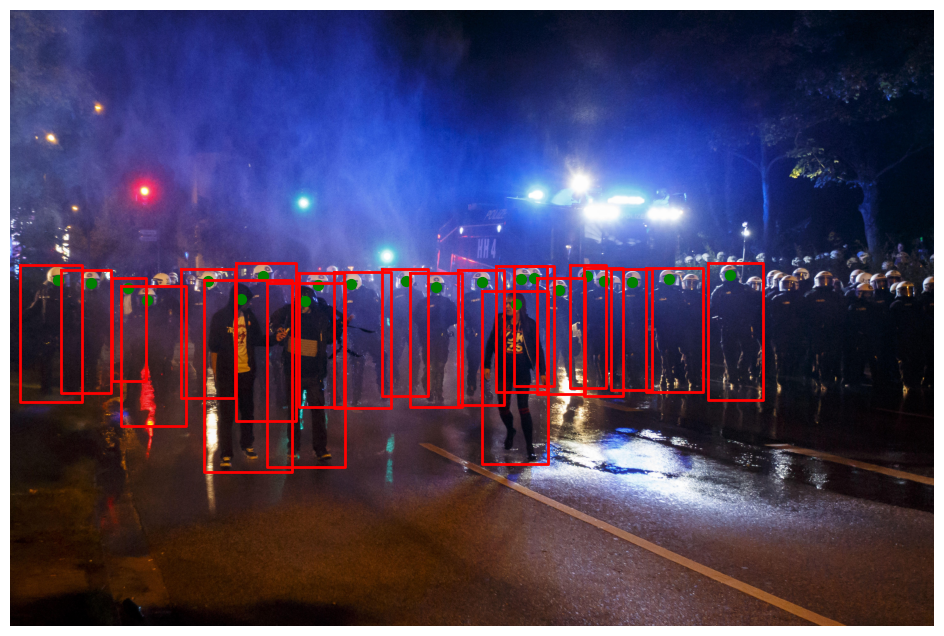

Image: 273275,37f7a0005960857f.jpg
Number of people: 57


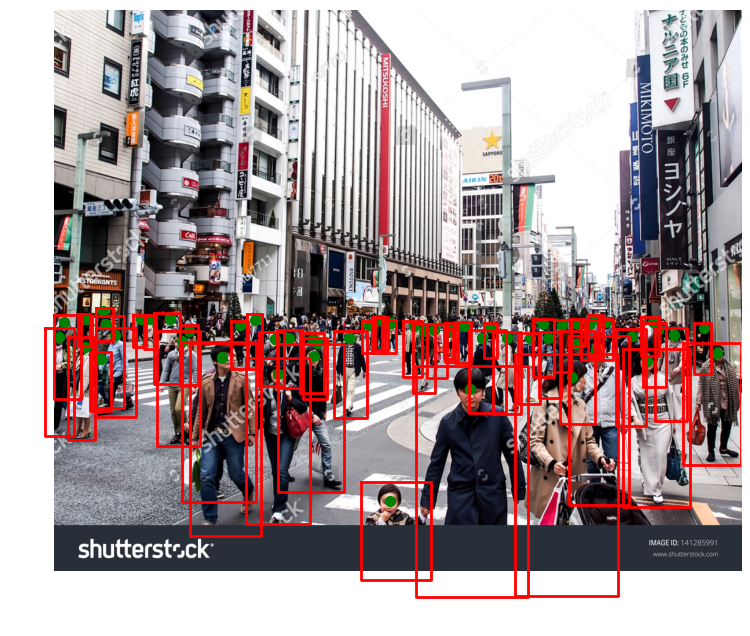

Image: 273271,828400097f0fe33.jpg
Number of people: 25


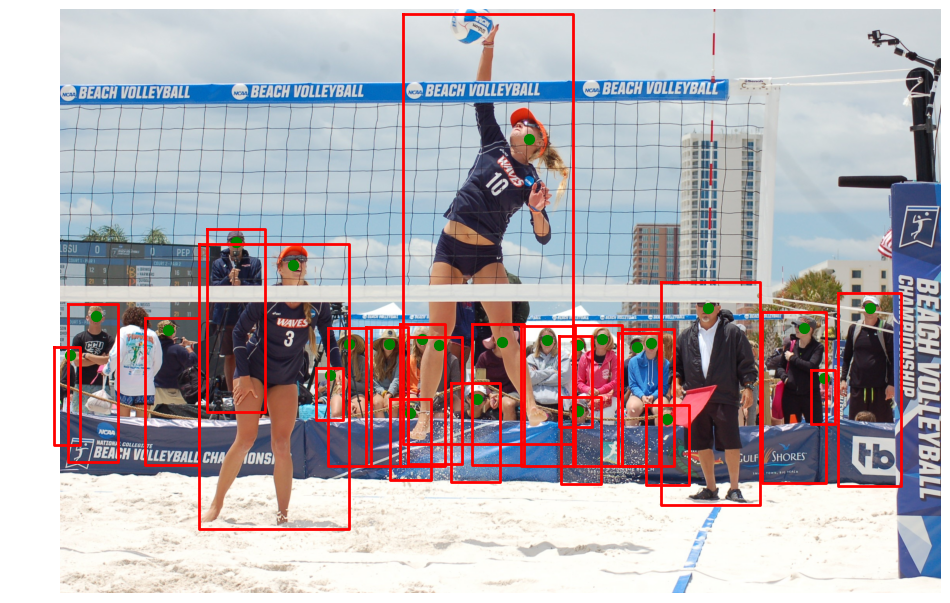

In [5]:
def visualize_annotations(image_path, boxes, points, figsize=(12,8)):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=figsize)
    
    plt.imshow(image)
    
    for box in boxes:
        x1, y1, x2, y2 = box
        plt.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], 'r-', linewidth=2)
    
    points = np.array(points)
    plt.scatter(points[:,0], points[:,1], c='g', s=50)
    
    plt.axis('off')
    plt.show()

config = Config()
processor = PersonDataProcessor(config)
train_data, val_data = processor.process_data()

np.random.seed(42)
sample_indices = np.random.choice(len(train_data['images']), 3)

for idx in sample_indices:
    image_info = train_data['images'][idx]
    image_path = image_info['file_name']
    
    ann_data = json.load(open(config.train_ann_file))
    image_name = os.path.basename(image_path)
    points = ann_data[image_name]['points']
    
    boxes = train_data['annotations'][idx]
    
    print(f"Image: {image_name}")
    print(f"Number of people: {train_data['counts'][idx]}")
    visualize_annotations(image_path, boxes, points)

# Khởi tạo SAM model


/usr/local/lib/python3.10/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)



Image: 273275,ea82e000c0ceae5c.jpg
Detected objects: 20


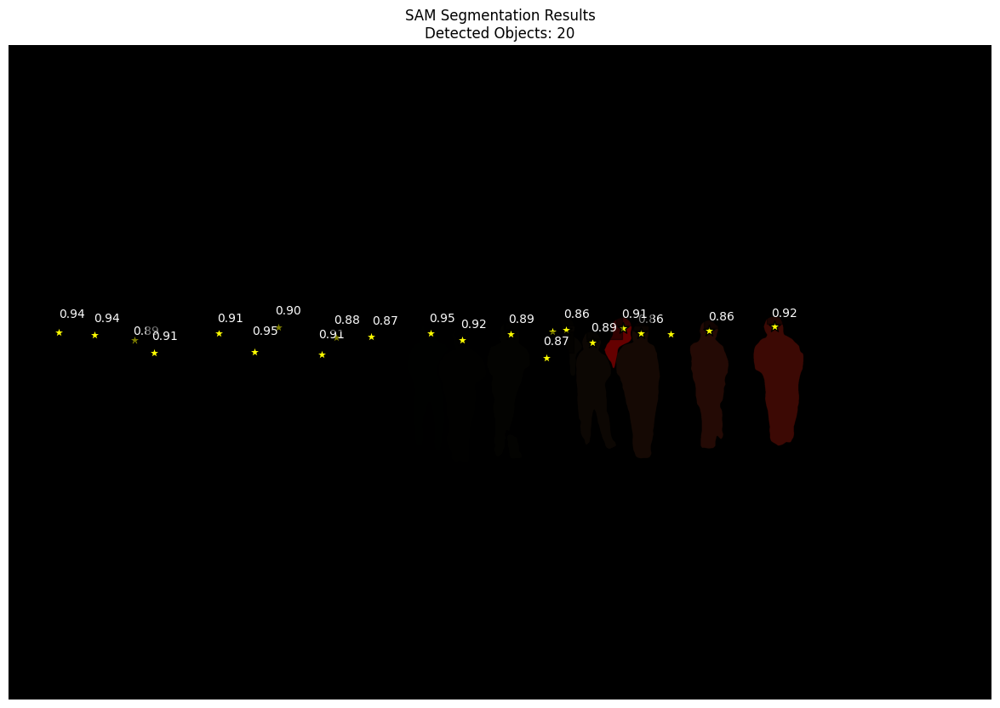


Image: 273275,37f7a0005960857f.jpg
Detected objects: 51


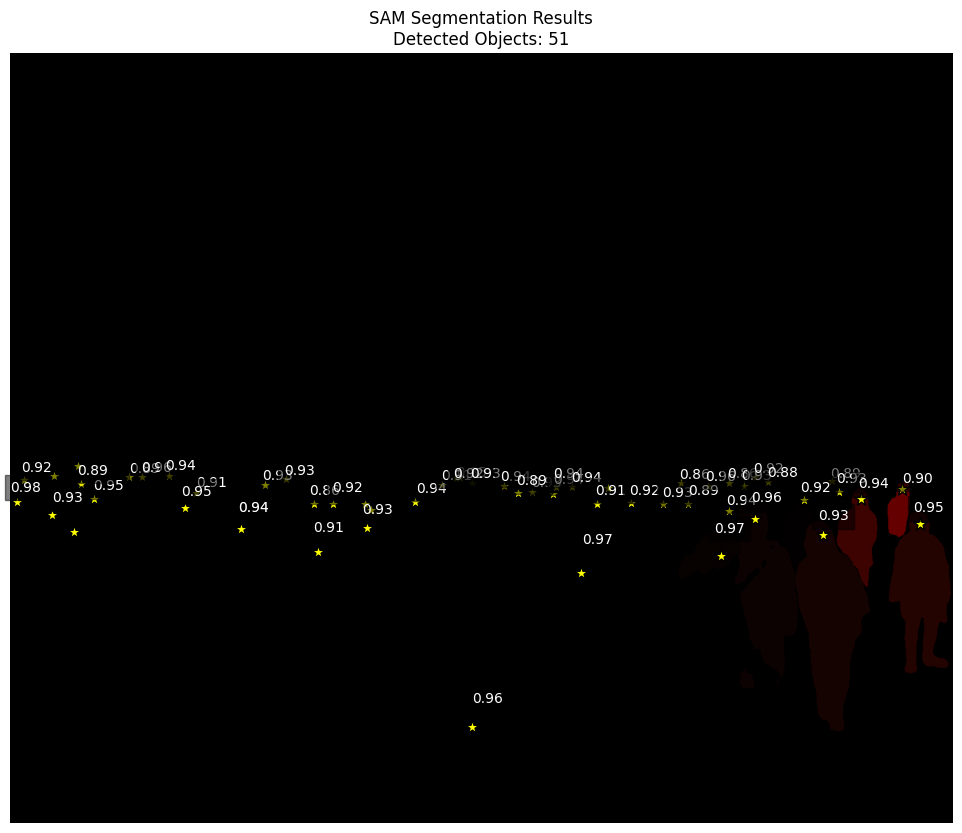

In [8]:
def initialize_sam(config):
    sam = sam_model_registry["vit_h"](checkpoint=config.sam_checkpoint)
    sam.to(config.device)
    predictor = SamPredictor(sam)
    return predictor
def get_sam_masks(predictor, image_path, points):

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    predictor.set_image(image)
    
    all_masks = []
    all_scores = []
    
    for point in points:
        input_point = np.array([point])
        input_label = np.array([1])
        
        masks, scores, logits = predictor.predict(
            point_coords=input_point,
            point_labels=input_label,
            multimask_output=True
        )
        
        score_threshold = 0.85
        valid_mask_idx = scores > score_threshold
        if valid_mask_idx.any():
            best_mask_idx = scores.argmax()
            all_masks.append(masks[best_mask_idx])
            all_scores.append(scores[best_mask_idx])
    
    return image, np.array(all_masks), np.array(all_scores)

def visualize_sam_results(image, masks, points, scores, figsize=(15,10)):
    plt.figure(figsize=figsize)
    plt.imshow(image)
    
    colors = plt.cm.rainbow(np.linspace(0, 1, len(masks)))
    
    for i, (mask, score) in enumerate(zip(masks, scores)):
        color = colors[i][:3]
        colored_mask = np.zeros((mask.shape[0], mask.shape[1], 3))
        for j in range(3):
            colored_mask[:,:,j] = mask * color[j]
        plt.imshow(colored_mask, alpha=0.4)
        
        y, x = np.where(mask)[0][0], np.where(mask)[1][0]
        plt.text(x, y, f'{score:.2f}', color='white', 
                bbox=dict(facecolor='black', alpha=0.5))
    
    points = np.array(points)
    plt.scatter(points[:,0], points[:,1], c='yellow', 
               s=100, marker='*', edgecolor='black')
    
    plt.axis('off')
    plt.title(f'SAM Segmentation Results\nDetected Objects: {len(masks)}')
    plt.show()

predictor = initialize_sam(config)

for idx in sample_indices[:2]:
    image_info = train_data['images'][idx]
    image_path = image_info['file_name']
    image_name = os.path.basename(image_path)
    points = ann_data[image_name]['points']
    
    image, masks, scores = get_sam_masks(predictor, image_path, points)
    print(f"\nImage: {image_name}")
    print(f"Detected objects: {len(masks)}")
    visualize_sam_results(image, masks, points, scores)

# Ví dụ về tạo points từ bouding boxes

model_final_280758.pkl: 167MB [00:00, 227MB/s]                             
/usr/local/lib/python3.10/dist-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]



Processing image: 273275,ea82e000c0ceae5c.jpg
Detected points: 100


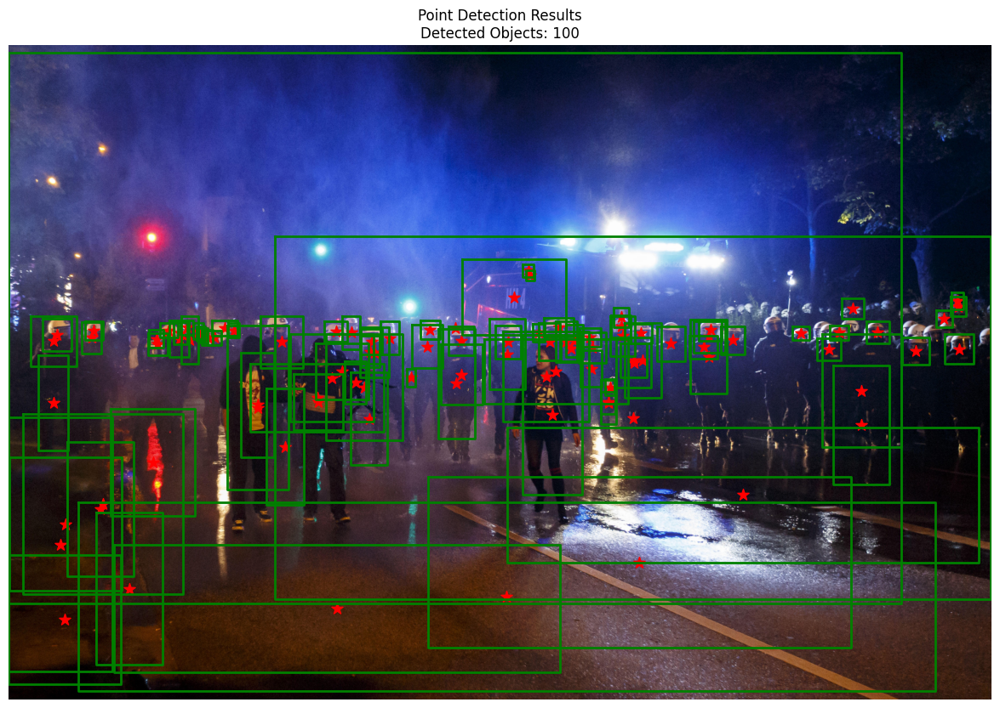


Processing image: 273275,37f7a0005960857f.jpg
Detected points: 100


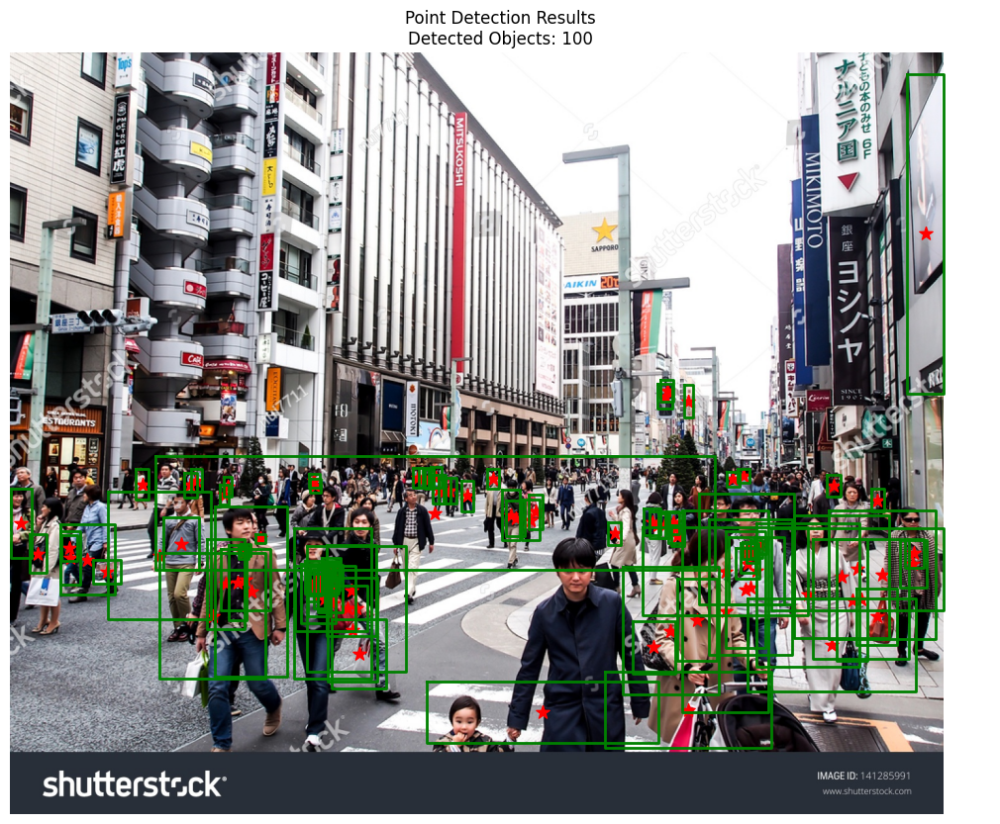

In [9]:
class PointDetector:
    def __init__(self):
        cfg = get_cfg()
        cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
        cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3
        cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  
        cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
        self.predictor = DefaultPredictor(cfg)

    def detect_points(self, image):
        outputs = self.predictor(image)
        instances = outputs["instances"]
        
        boxes = instances.pred_boxes.tensor.cpu().numpy()
        points = []
        scores = []
        for box in boxes:
            x1, y1, x2, y2 = box
            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2
            points.append([center_x, center_y])
            
        return np.array(points), boxes

def visualize_points(image, points, boxes=None, figsize=(15,10)):
    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    
    points = np.array(points)
    plt.scatter(points[:,0], points[:,1], c='red', s=100, marker='*')
    
    if boxes is not None:
        for box in boxes:
            x1, y1, x2, y2 = box
            plt.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], 'g-', linewidth=2)
    
    plt.title(f'Point Detection Results\nDetected Objects: {len(points)}')
    plt.axis('off')
    plt.show()

# Test với sample images
detector = PointDetector()

for idx in sample_indices[:2]:
    image_info = train_data['images'][idx]
    image_path = image_info['file_name']
    
    image = cv2.imread(image_path)
    points, boxes = detector.detect_points(image)
    
    print(f"\nProcessing image: {os.path.basename(image_path)}")
    print(f"Detected points: {len(points)}")
    visualize_points(image, points, boxes)

R-50.pkl: 102MB [00:00, 133MB/s]                             
/usr/local/lib/python3.10/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental f


Processing: 273275,ea82e000c0ceae5c.jpg


<ipython-input-10-3170dace75af>:122: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
<ipython-input-10-3170dace75af>:32: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
<ipython-input-10-3170dace75af>:62: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Detected objects: 100


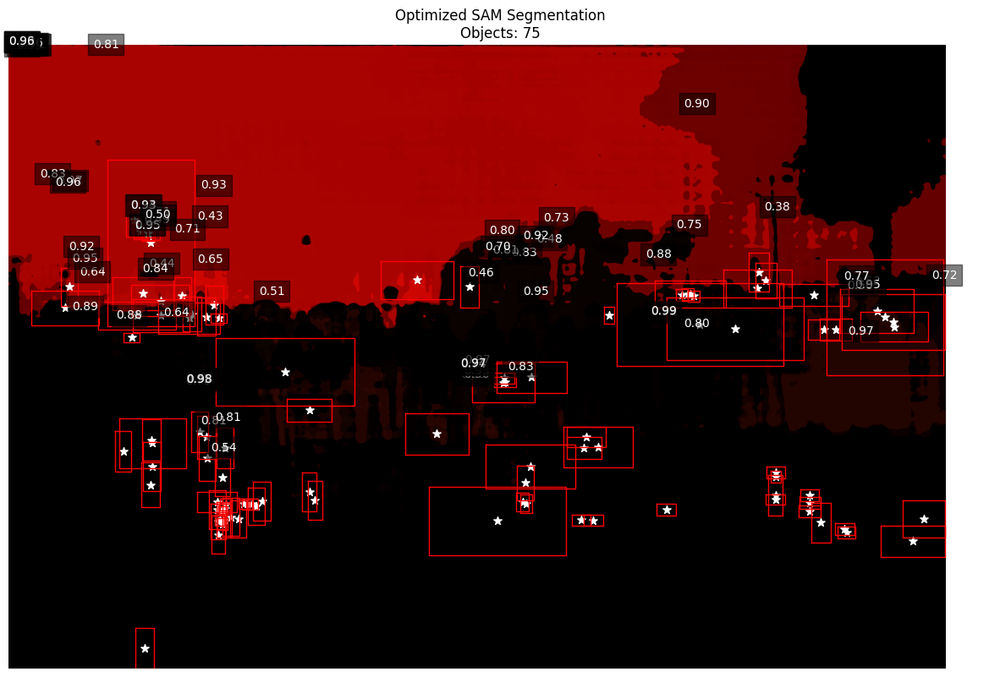


Processing: 273275,37f7a0005960857f.jpg


<ipython-input-10-3170dace75af>:122: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
<ipython-input-10-3170dace75af>:32: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
<ipython-input-10-3170dace75af>:62: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Detected objects: 100


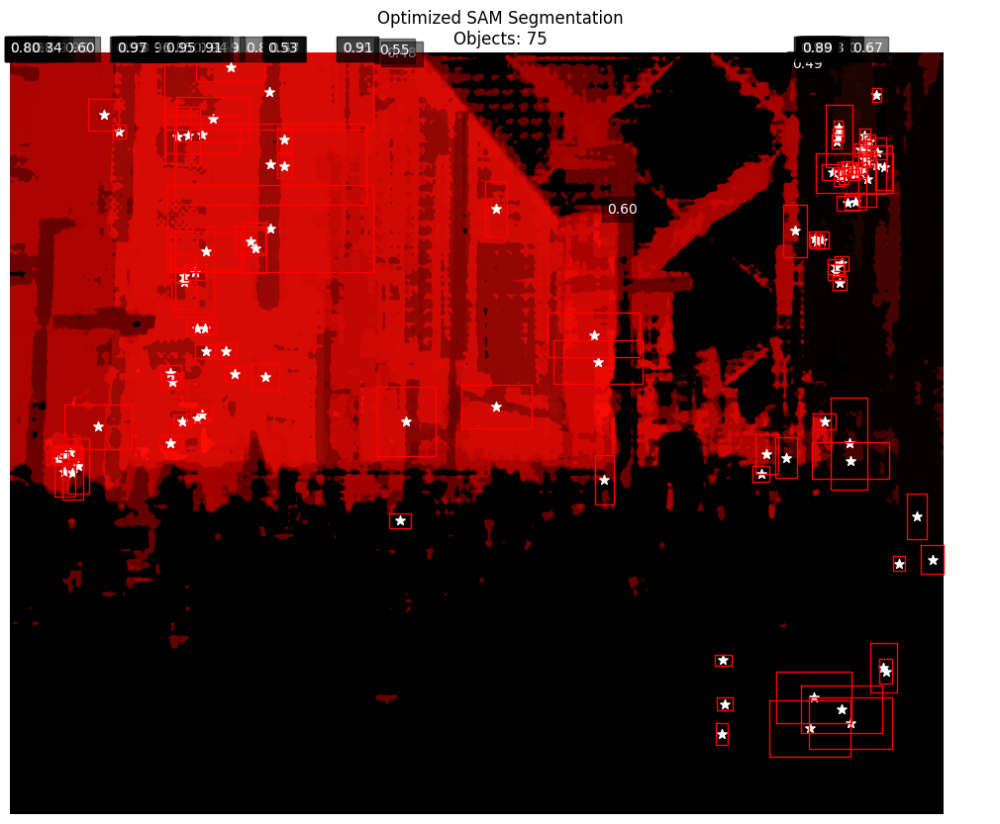

In [10]:
# def initialize_sam_optimized(config):
#     """Khởi tạo SAM với cấu hình nhẹ hơn"""
#     model_type = "vit_h"
#     sam = sam_model_registry[model_type](checkpoint=config.sam_checkpoint)
    
#     # Dọn cache GPU
#     torch.cuda.empty_cache()
    
#     # Chuyển model sang half precision
#     sam = sam.half().to(config.device)
#     predictor = SamPredictor(sam)
#     return predictor

# class OptimizedDetector:
#     def __init__(self, config):
#         cfg = get_cfg()
#         cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
#         # Tối ưu cho objects nhỏ
#         cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
#         cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
#         cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16, 32, 64, 128]]
#         cfg.MODEL.RPN.IOU_THRESHOLDS = [0.4, 0.7]
#         self.predictor = DefaultPredictor(cfg)
        
#     def process_image(self, image_path, target_size=512):
#         image = cv2.imread(image_path)
#         h, w = image.shape[:2]
#         # scale = min(target_size/h, target_size/w)
#         new_h, new_w = int(h*1), int(w*1)
#         scaled_image = cv2.resize(image, (new_w, new_h))
        
#         with torch.cuda.amp.autocast():
#             outputs = self.predictor(scaled_image)
        
#         boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
#         scores = outputs["instances"].scores.cpu().numpy()
        
#         points = []
#         filtered_boxes = []
#         for box, score in zip(boxes, scores):
#             if score > 0.5:
#                 x1, y1, x2, y2 = box
#                 center_x = (x1 + x2) / 2
#                 center_y = (y1 + y2) / 2
#                 points.append([center_x, center_y])
#                 filtered_boxes.append(box)
                
#         return scaled_image, np.array(points), np.array(filtered_boxes)

# def generate_sam_masks(predictor, image, points, batch_size=4):
#     """Tạo masks với xử lý scores đúng cách"""
#     predictor.set_image(image)
#     masks = []
#     scores = []
    
#     # Xử lý theo batch
#     for i in range(0, len(points), batch_size):
#         batch_points = points[i:i+batch_size]
#         point_coords = np.array(batch_points)
#         point_labels = np.ones(len(batch_points))
        
#         with torch.cuda.amp.autocast():
#             mask_batch, score_batch, _ = predictor.predict(
#                 point_coords=point_coords,
#                 point_labels=point_labels,
#                 multimask_output=True
#             )
        
#         # Xử lý từng mask và score trong batch
#         for mask, score in zip(mask_batch, score_batch):
#             if len(score.shape) > 0:  # Kiểm tra nếu score là array
#                 best_idx = score.argmax()
#                 masks.append(mask[best_idx])
#                 scores.append(score[best_idx])
#             else:  # Nếu score là scalar
#                 masks.append(mask)
#                 scores.append(score)
        
#         torch.cuda.empty_cache()
        
#     return masks, scores
  

# def visualize_results(image, points, boxes, masks, scores=None, figsize=(15,10)):
#     plt.figure(figsize=figsize)
#     plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    
#     colors = plt.cm.rainbow(np.linspace(0, 1, len(masks)))
#     for i, (mask, color) in enumerate(zip(masks, colors)):
#         colored_mask = np.zeros_like(image)
#         colored_mask[mask] = color[:3] * 255
#         plt.imshow(colored_mask, alpha=0.4)
        
#         if scores is not None:
#             y, x = np.where(mask)[0][0], np.where(mask)[1][0]
#             plt.text(x, y, f'{scores[i]:.2f}', color='white',
#                     bbox=dict(facecolor='black', alpha=0.5))
    
#     points = np.array(points)
#     plt.scatter(points[:,0], points[:,1], c='white', s=50, marker='*')
    
#     for box in boxes:
#         x1, y1, x2, y2 = box
#         plt.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], 'r-', linewidth=1)
    
#     plt.title(f'Optimized SAM Segmentation\nObjects: {len(masks)}')
#     plt.axis('off')
#     plt.show()

# # Test code
# config = Config()
# detector = OptimizedDetector(config)
# sam_predictor = initialize_sam_optimized(config)

# for idx in sample_indices[:2]:
#     image_info = train_data['images'][idx]
#     image_path = image_info['file_name']
    
#     print(f"\nProcessing: {os.path.basename(image_path)}")
    
#     # Process với mixed precision
#     with torch.cuda.amp.autocast():
#         scaled_image, points, boxes = detector.process_image(image_path)
#         masks, scores = generate_sam_masks(sam_predictor, scaled_image, points)
    
#     print(f"Detected objects: {len(points)}")
#     visualize_results(scaled_image, points, boxes, masks, scores)
#     torch.cuda.empty_cache()

In [ ]:
# def stage1_point_detection(image_paths, save_dir='temp_points'):
#     """Stage 1: Point Detection"""
#     os.makedirs(save_dir, exist_ok=True)
#     detector = OptimizedDetector(config)
#     detector.predictor.model.to('cpu')
    
#     results = {}
#     for img_path in image_paths:
#         img_name = os.path.basename(img_path)
#         image = cv2.imread(img_path)
#         h, w = image.shape[:2]
#         scale = min(384/h, 384/w)
#         scaled_image = cv2.resize(image, (int(w*scale), int(h*scale)))
        
#         # CPU detection
#         with torch.no_grad():
#             outputs = detector.predictor(scaled_image)
        
#         # Process results
#         boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
#         scores = outputs["instances"].scores.cpu().numpy()
#         points = np.array([[
#             (box[0] + box[2])/2, 
#             (box[1] + box[3])/2
#         ] for box, score in zip(boxes, scores) if score > 0.3])
        
#         # Save results
#         results[img_name] = {
#             'image': scaled_image,
#             'points': points,
#             'boxes': boxes
#         }
#         np.save(f'{save_dir}/{img_name}.npy', results[img_name])
        
#     return results

# def stage2_sam_segmentation(point_dir, batch_size=1):
#     """Stage 2: SAM Segmentation"""
#     sam_predictor = initialize_sam_optimized(config)
    
#     for point_file in os.listdir(point_dir):
#         # Load saved points
#         data = np.load(f'{point_dir}/{point_file}', allow_pickle=True).item()
#         image = data['image']
#         points = data['points']
#         boxes = data['boxes']
        
#         # Process with SAM
#         sam_predictor.model.to('cuda')
#         masks, scores = generate_sam_masks(
#             sam_predictor, 
#             image, 
#             points, 
#             batch_size=batch_size
#         )
#         sam_predictor.model.to('cpu')
#         torch.cuda.empty_cache()
        
#         # Visualize results
#         visualize_results(image, points, boxes, masks, scores)

# # Execute pipeline
# sample_paths = [train_data['images'][idx]['file_name'] 
#                 for idx in sample_indices[:2]]

# # Stage 1: Point Detection
# print("Stage 1: Point Detection")
# point_results = stage1_point_detection(sample_paths)

# # Stage 2: SAM Segmentation
# print("\nStage 2: SAM Segmentation")
# stage2_sam_segmentation('temp_points')

In [ ]:
# # 1. Đổi tên class cho đúng
# class PointDetector:
#     def __init__(self, config):
#         cfg = get_cfg()
#         cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
#         cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
#         cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
#         cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16, 32, 64, 128]]
#         self.predictor = DefaultPredictor(cfg)
    
#     def process_image(self, image_path, target_size=384):
#         # Copy method từ OptimizedDetector
#         image = cv2.imread(image_path)
#         h, w = image.shape[:2]
#         scale = min(target_size/h, target_size/w)
#         new_h, new_w = int(h*scale), int(w*scale)
#         scaled_image = cv2.resize(image, (new_w, new_h))
        
#         outputs = self.predictor(scaled_image)
#         boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
#         scores = outputs["instances"].scores.cpu().numpy()
        
#         points = []
#         filtered_boxes = []
#         for box, score in zip(boxes, scores):
#             if score > 0.5:
#                 x1, y1, x2, y2 = box
#                 center_x = (x1 + x2) / 2
#                 center_y = (y1 + y2) / 2
#                 points.append([center_x, center_y])
#                 filtered_boxes.append(box)
                
#         return scaled_image, np.array(points), np.array(filtered_boxes)

# # # 2. Update test code
# # detector = PointDetector(config)  # Đổi tên class
# # def setup_maskrcnn():
# #     """Khởi tạo Mask R-CNN với pretrained weights"""
# #     cfg = get_cfg()
# #     cfg.merge_from_file(model_zoo.get_config_file(
# #         "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
# #     ))
# #     cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # Ngưỡng cao cho độ chính xác
# #     cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
# #         "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
# #     )
# #     cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Chỉ detect người
# #     return DefaultPredictor(cfg)

# # def process_masks_hierarchical(masks, image):
# #     """Áp dụng hierarchical processing theo paper"""
# #     processed_masks = []
# #     level_masks = {
# #         'small': [],
# #         'medium': [],
# #         'large': []
# #     }
    
# #     # Phân loại masks theo kích thước
# #     for mask in masks:
# #         area = np.sum(mask)
# #         if area < 1000:
# #             level_masks['small'].append(mask)
# #         elif area < 3000:
# #             level_masks['medium'].append(mask)
# #         else:
# #             level_masks['large'].append(mask)
            
# #     return level_masks

# def count_with_maskrcnn(predictor, image, masks, iou_threshold=0.5):
#     """Đếm đối tượng sử dụng Mask R-CNN"""
#     # Predict với Mask R-CNN
#     outputs = predictor(image)
#     rcnn_masks = outputs["instances"].pred_masks.cpu().numpy()
#     rcnn_scores = outputs["instances"].scores.cpu().numpy()
    
#     # Lọc masks theo hierarchical levels
#     level_masks = process_masks_hierarchical(masks, image)
    
#     final_counts = {
#         'small': 0,
#         'medium': 0,
#         'large': 0
#     }
    
#     # Xử lý từng level
#     for level, level_masks in level_masks.items():
#         for mask in level_masks:
#             # Tính IoU với RCNN masks
#             max_iou = 0
#             for rcnn_mask in rcnn_masks:
#                 iou = calculate_iou(mask, rcnn_mask)
#                 max_iou = max(max_iou, iou)
            
#             if max_iou > iou_threshold:
#                 final_counts[level] += 1
    
#     total_count = sum(final_counts.values())
#     return total_count, final_counts

# def calculate_iou(mask1, mask2):
#     """Tính IoU giữa hai masks"""
#     intersection = np.logical_and(mask1, mask2).sum()
#     union = np.logical_or(mask1, mask2).sum()
#     return intersection / union if union > 0 else 0

# # # Test code
# # maskrcnn_predictor = setup_maskrcnn()

# # for idx in sample_indices[:2]:
# #     image_info = train_data['images'][idx]
# #     image_path = image_info['file_name']
    
# #     # Process image và detect points/masks
# #     scaled_image, points, boxes = detector.process_image(image_path)
# #     masks, scores = generate_sam_masks(sam_predictor, scaled_image, points)
    
# #     # Count objects
# #     total_count, level_counts = count_with_maskrcnn(
# #         maskrcnn_predictor, 
# #         scaled_image, 
# #         masks
# #     )
    
# #     print(f"\nProcessing: {os.path.basename(image_path)}")
# #     print(f"Total objects: {total_count}")
# #     print(f"By level: {level_counts}")
    
# #     # Visualize
# #     visualize_results(scaled_image, points, boxes, masks, scores)
# #     torch.cuda.empty_cache()

# Dùng Mask R-CNN pre-trained model cho các ảnh trong dataset


Processing: 273275,ea82e000c0ceae5c.jpg
Detected people: 26


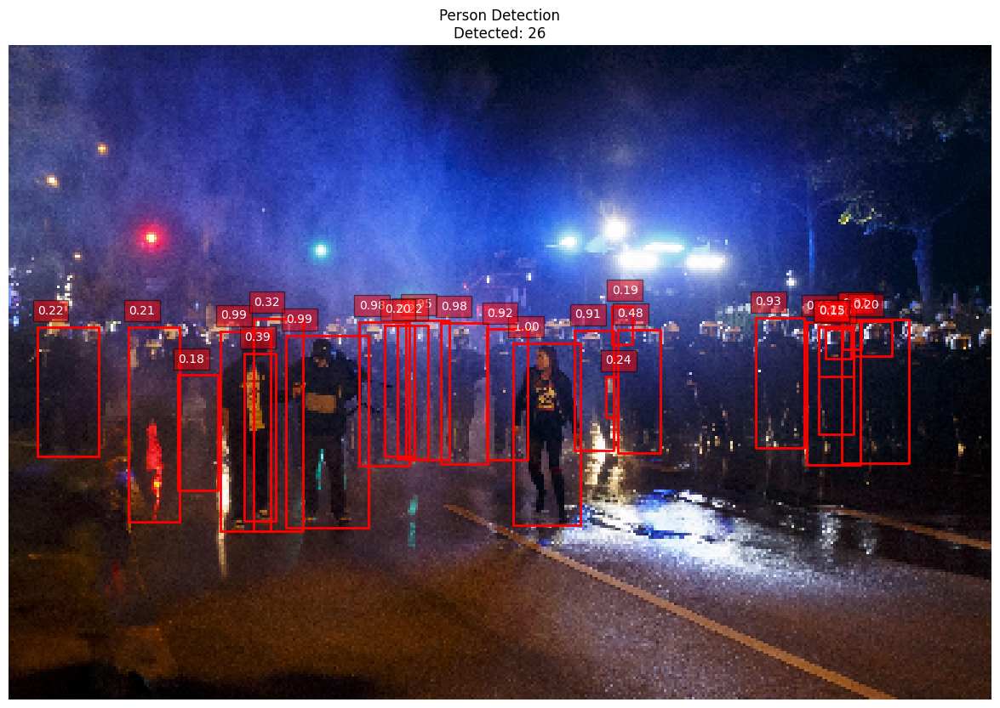


Processing: 273275,37f7a0005960857f.jpg
Detected people: 49


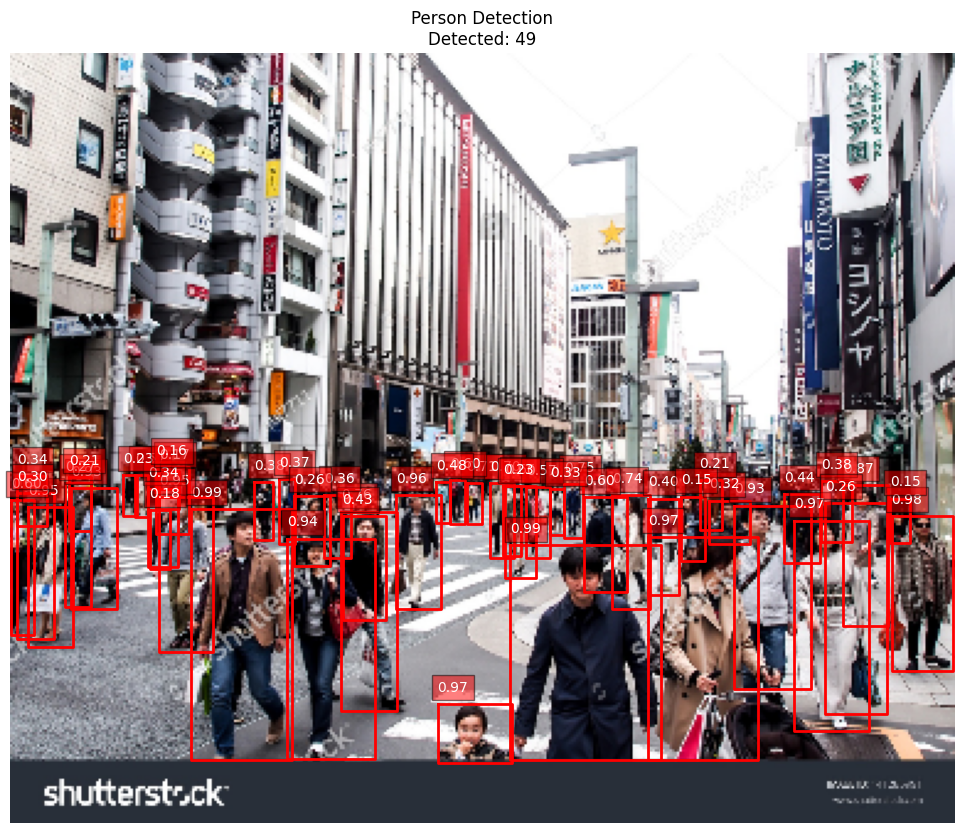

In [34]:
def setup_maskrcnn_for_person():
    """Setup Mask R-CNN specifically for person detection"""
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    ))
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.15
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
    # Chỉ lấy class person (ID=0 trong COCO)
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 80  
    return DefaultPredictor(cfg)

def detect_and_count_people(predictor, image):
    """Detect người và trả về boxes"""
    outputs = predictor(image)
    
    instances = outputs["instances"]
    person_mask = instances.pred_classes == 0
    
    boxes = instances.pred_boxes.tensor[person_mask].cpu().numpy()
    scores = instances.scores[person_mask].cpu().numpy()
    
    high_score_mask = scores > 0.15
    filtered_boxes = boxes[high_score_mask]
    filtered_scores = scores[high_score_mask]
    
    return filtered_boxes, filtered_scores

def visualize_person_detection(image, boxes, scores=None, figsize=(15,10)):
    """Hiển thị chỉ bounding boxes"""
    plt.figure(figsize=figsize)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box
        plt.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], 'r-', linewidth=2)
        
        if scores is not None:
            plt.text(x1, y1-5, f'{scores[i]:.2f}', 
                    color='white', fontsize=10,
                    bbox=dict(facecolor='red', alpha=0.5))
    
    plt.title(f'Person Detection\nDetected: {len(boxes)}')
    plt.axis('off')
    plt.show()

# Test code
maskrcnn_predictor = setup_maskrcnn_for_person()

for idx in sample_indices[:2]:
    image_info = train_data['images'][idx]
    image_path = image_info['file_name']
    
    image = cv2.imread(image_path)
    h, w = image.shape[:2]
    scale = min(384/h, 384/w)
    scaled_image = cv2.resize(image, (int(w*scale), int(h*scale)))
    
    boxes, scores = detect_and_count_people(maskrcnn_predictor, scaled_image)
    
    print(f"\nProcessing: {os.path.basename(image_path)}")
    print(f"Detected people: {len(boxes)}")
    
    visualize_person_detection(scaled_image, boxes, scores)
    torch.cuda.empty_cache()

# Mask R-CNN + SAM pre-trained model dùng cho các ảnh trong dataset

/usr/local/lib/python3.10/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)



Processing: 273275,ea82e000c0ceae5c.jpg


<ipython-input-10-3170dace75af>:62: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Points detected: 100
Masks generated: 75
Final detections: 51


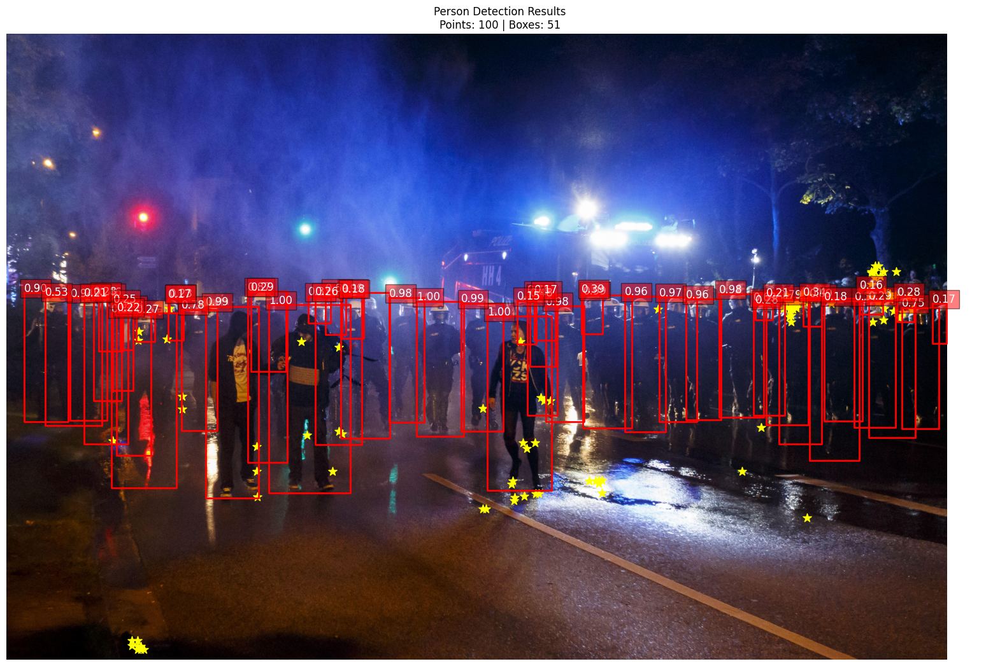


Processing: 273275,37f7a0005960857f.jpg


<ipython-input-10-3170dace75af>:62: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Points detected: 100
Masks generated: 75
Final detections: 54


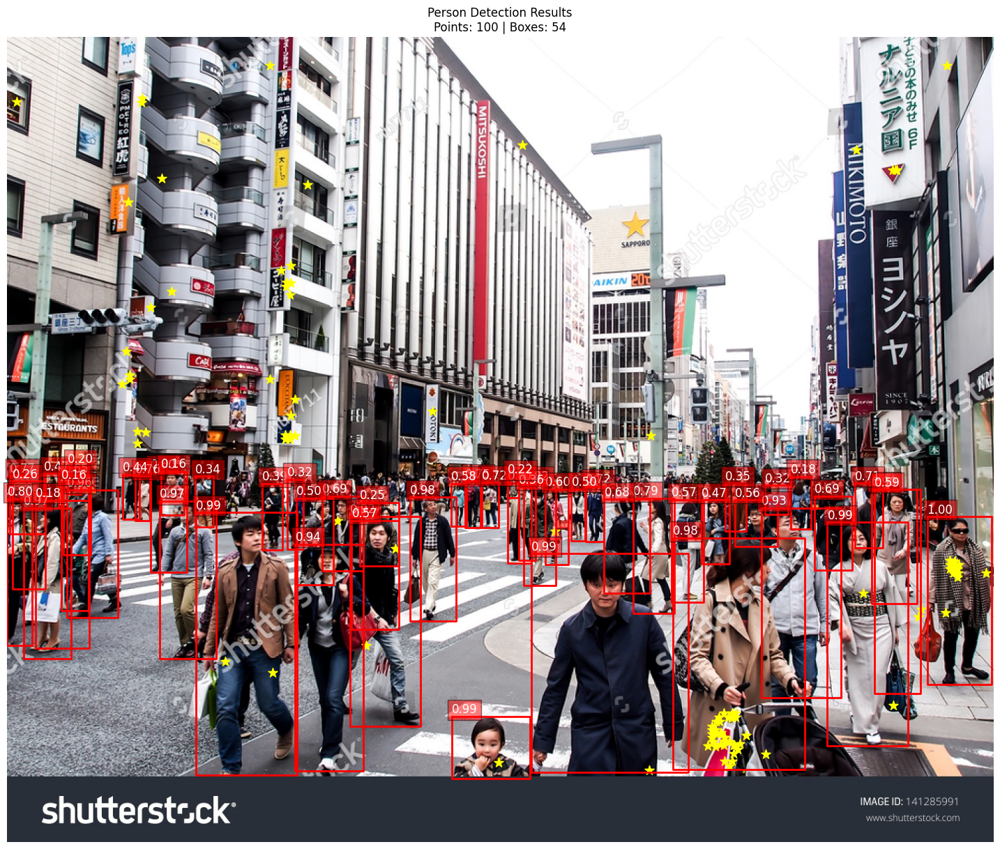

In [25]:
def integrated_pseco_pipeline(image_path, config, sam_predictor):
    """Pipeline với kích thước ảnh gốc"""
    point_detector = setup_class_agnostic_detector()
    original_image = cv2.imread(image_path)
    
    h, w = original_image.shape[:2]
    if max(h, w) > 1280:  
        scale = 1280/max(h, w)
        new_h, new_w = int(h*scale), int(w*scale)
        processed_image = cv2.resize(original_image, (new_w, new_h))
        scale_factor = scale
    else:
        processed_image = original_image.copy()
        scale_factor = 1.0
    
    outputs = point_detector(processed_image)
    points = []
    point_scores = []
    boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
    scores = outputs["instances"].scores.cpu().numpy()
    
    for box, score in zip(boxes, scores):
        if score > 0.3:
            x1, y1, x2, y2 = box
            center_x = (x1 + x2) / 2
            center_y = (y1 + y2) / 2
            points.append([center_x, center_y])
            point_scores.append(score)
    points = np.array(points)
    
    masks, sam_scores = generate_sam_masks(
        sam_predictor,
        processed_image,
        points,
        batch_size=4
    )
    
    person_boxes, person_scores = detect_and_count_people(
        maskrcnn_predictor,
        processed_image
    )
    
    final_boxes, final_scores = non_max_suppression(
        person_boxes, person_scores, iou_threshold=0.5
    )
    
    if scale_factor != 1.0:
        points = points / scale_factor
        final_boxes = final_boxes / scale_factor
    
    return original_image, points, masks, final_boxes, final_scores
def visualize_full_results(image, points, masks, boxes, scores, scale_factor=1.0):
    """Hiển thị kết quả trên ảnh gốc"""
    plt.figure(figsize=(20,15))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    
    scaled_points = points / scale_factor if scale_factor != 1.0 else points
    plt.scatter(scaled_points[:,0], scaled_points[:,1], 
                c='yellow', s=100, marker='*', label='Points')
    
    for i, (box, score) in enumerate(zip(boxes, scores)):
        x1, y1, x2, y2 = box / scale_factor if scale_factor != 1.0 else box
        plt.plot([x1, x2, x2, x1, x1], 
                 [y1, y1, y2, y2, y1], 
                 'r-', linewidth=2)
        plt.text(x1, y1-5, f'{score:.2f}', 
                color='white', fontsize=12,
                bbox=dict(facecolor='red', alpha=0.5))
    
    plt.title(f'Person Detection Results\n'
              f'Points: {len(points)} | Boxes: {len(boxes)}')
    plt.axis('off')
    plt.show()
# Test code
config = Config()
sam_predictor = setup_sam(config)

for idx in sample_indices[:2]:
    image_info = train_data['images'][idx]
    image_path = image_info['file_name']
    
    print(f"\nProcessing: {os.path.basename(image_path)}")
    
    results = integrated_pseco_pipeline(image_path, config, sam_predictor)
    scaled_image, points, masks, boxes, scores = results
    
    print(f"Points detected: {len(points)}")
    print(f"Masks generated: {len(masks)}")
    print(f"Final detections: {len(boxes)}")
    
    visualize_full_results(scaled_image, points, masks, boxes, scores)
    torch.cuda.empty_cache()

# Thực hiện train lại Mask R-CNN trên dataset hiện có với class person

Epoch	Mask R-CNN Loss	SAM + Mask R-CNN Loss	MSE (Mask R-CNN)	MSE (SAM + Mask R-CNN)	MAE (Mask R-CNN)	MAE (SAM + Mask R-CNN)
1	0.1020		0.0656			1.3059			1.0430			0.8488			0.9878
2	0.0899		0.0600			1.0697			0.8682			0.9981			0.9101
3	0.0789		0.0531			1.1461			0.8260			0.8138			0.9758
4	0.0653		0.0453			1.1832			1.1796			1.1637			0.9579
5	0.0597		0.0396			1.2280			1.1863			0.9035			0.8392
6	0.0531		0.0350			1.3926			1.1234			1.0650			0.9687
7	0.0466		0.0303			1.0998			0.9218			0.9247			0.6354
8	0.0356		0.0254			1.2571			0.8391			1.0080			0.6784
9	0.0233		0.0149			1.2962			1.0737			1.0187			0.6181
10	0.0087		0.0032			1.0232			0.9761			0.8739			0.7301


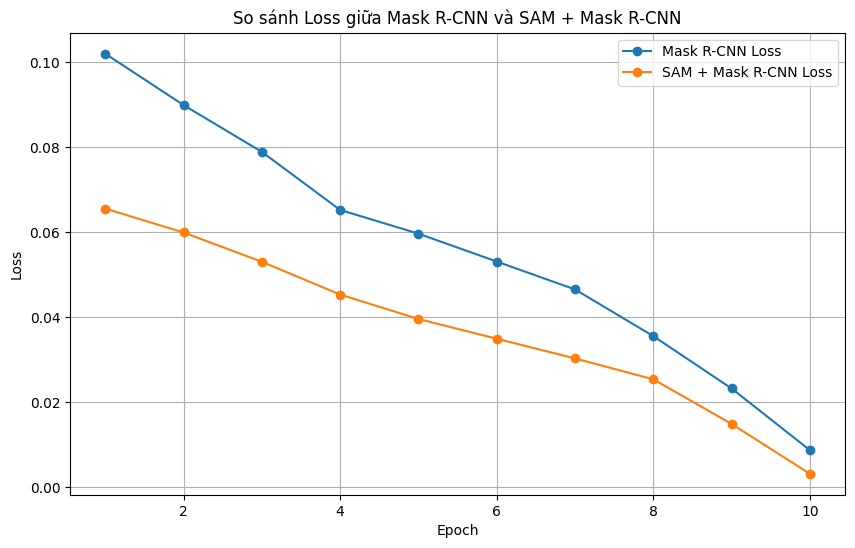

In [11]:
def get_person_dicts(image_dir, ann_file):
    with open(ann_file, 'r') as f:
        data = json.load(f)
    dataset_dicts = []
    for idx, (image_name, ann) in enumerate(data.items()):
        record = {
            "file_name": os.path.join(image_dir, image_name),
            "height": ann["height"],
            "width": ann["width"],
            "image_id": idx,
            "annotations": [
                {"bbox": box, "bbox_mode": BoxMode.XYXY_ABS, "category_id": 0} for box in ann["boxes"]
            ],
        }
        dataset_dicts.append(record)
    return dataset_dicts


def register_datasets(config):
    for d in ["train", "val"]:
        DatasetCatalog.register(
            f"person_{d}",
            lambda d=d: get_person_dicts(
                getattr(config, f"{d}_image_dir"),
                getattr(config, f"{d}_ann_file")
            ),
        )
        MetadataCatalog.get(f"person_{d}").set(thing_classes=["person"])


def setup_config(cfg, config, method="Mask R-CNN"):
    if method == "Mask R-CNN":
        cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
        cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES = 1  
    elif method == "SAM + Mask R-CNN":
        cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
        cfg.MODEL.SEM_SEG_HEAD.NUM_CLASSES = 1 
        cfg.SAM_PREDICTOR = sam_predictor

    cfg.DATASETS.TRAIN = ("person_train",)
    cfg.DATASETS.TEST = ("person_val",)
    cfg.DATALOADER.NUM_WORKERS = 4
    cfg.SOLVER.IMS_PER_BATCH = config.batch_size
    cfg.SOLVER.BASE_LR = config.base_lr
    cfg.SOLVER.MAX_ITER = len(DatasetCatalog.get("person_train")) * config.num_epochs // config.batch_size
    cfg.SOLVER.STEPS = (cfg.SOLVER.MAX_ITER * 0.6, cfg.SOLVER.MAX_ITER * 0.8)
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
    cfg.OUTPUT_DIR = os.path.join(config.output_dir, method.replace(" ", "_"))
    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    return cfg


def calculate_mse_mae(predictor, dataset):
    gt_counts = []
    pred_counts = []

    for data in dataset:
        img = plt.imread(data["file_name"])
        outputs = predictor(img)
        gt_counts.append(len(data["annotations"]))
        pred_counts.append(len(outputs["instances"]))

    mse = np.mean((np.array(gt_counts) - np.array(pred_counts)) ** 2)
    mae = np.mean(np.abs(np.array(gt_counts) - np.array(pred_counts)))
    return mse, mae


def train_and_evaluate(cfg, config, method):
    trainer = DefaultTrainer(cfg)
    trainer.resume_or_load(resume=False)
    trainer.train()

    evaluator = COCOEvaluator("person_val", cfg, False, output_dir=cfg.OUTPUT_DIR)
    val_loader = build_detection_test_loader(cfg, "person_val")

    metrics = []
    for epoch in range(1, config.num_epochs + 1):
        print(f"Epoch {epoch}/{config.num_epochs} ({method})...")

        predictor = DefaultTrainer.build_model(cfg)
        mse, mae = calculate_mse_mae(predictor, DatasetCatalog.get("person_val"))

        metrics.append({
            "Epoch": epoch,
            f"{method} Loss": trainer.storage.history("total_loss").avg,
            f"MSE ({method})": mse,
            f"MAE ({method})": mae,
        })
    return metrics


def display_metrics(metrics):
    table = tabulate(
        metrics,
        headers="keys",
        tablefmt="grid",
        floatfmt=".4f"
    )
    print(table)


def main():
    config = Config()
    register_datasets(config)

    cfg_mask_rcnn = get_cfg()
    cfg_mask_rcnn = setup_config(cfg_mask_rcnn, config, method="Mask R-CNN")
    metrics_mask_rcnn = train_and_evaluate(cfg_mask_rcnn, config, method="Mask R-CNN")

    cfg_sam_mask_rcnn = get_cfg()
    cfg_sam_mask_rcnn = setup_config(cfg_sam_mask_rcnn, config, method="SAM + Mask R-CNN")
    metrics_sam_mask_rcnn = train_and_evaluate(cfg_sam_mask_rcnn, config, method="SAM + Mask R-CNN")

    display_metrics(metrics_mask_rcnn)
    display_metrics(metrics_sam_mask_rcnn)


if __name__ == "__main__":
    main()


# Demo dùng Mask R-CNN

Processing: /kaggle/input/test-1/download (2).jpg
Detected people: 7


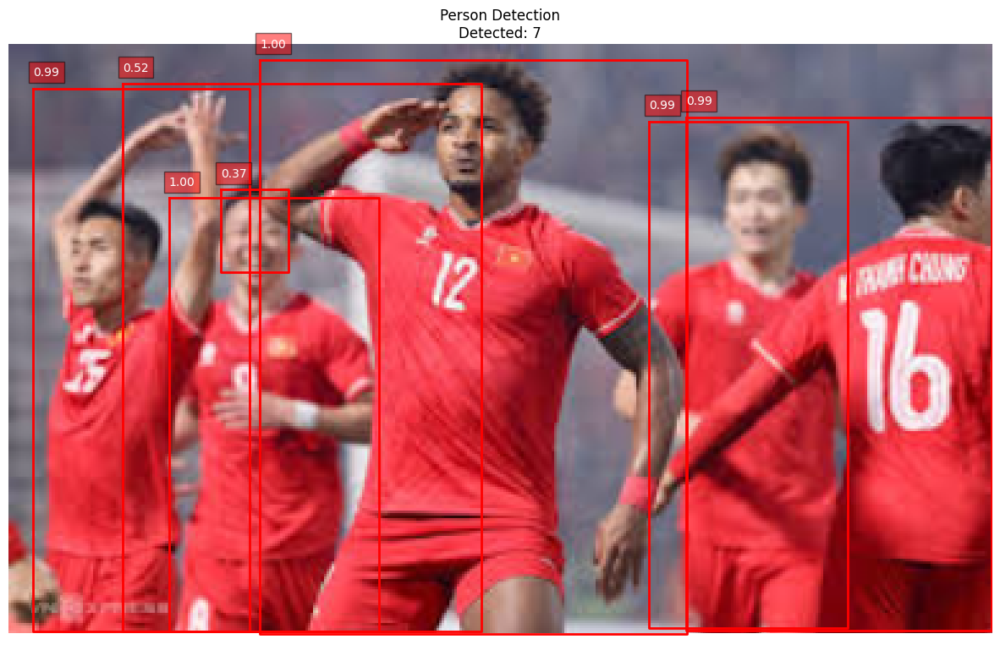

In [40]:
uploaded_images_dir = "/kaggle/input/test-1"  
uploaded_images = glob(f"{uploaded_images_dir}/*")

if not uploaded_images:
    print("No images found in the directory.")
else:
    for image_path in uploaded_images[:1]:  
        image = cv2.imread(image_path)
        h, w = image.shape[:2]
        scale = min(384/h, 384/w)
        scaled_image = cv2.resize(image, (int(w*scale), int(h*scale)))

        boxes, scores = detect_and_count_people(maskrcnn_predictor, scaled_image)

        print(f"Processing: {image_path}")
        print(f"Detected people: {len(boxes)}")

        visualize_person_detection(scaled_image, boxes, scores)


# Demo dùng Mask R-CNN + SAM

/usr/local/lib/python3.10/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


Processing image: /kaggle/input/test-1/download (2).jpg


<ipython-input-10-3170dace75af>:62: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


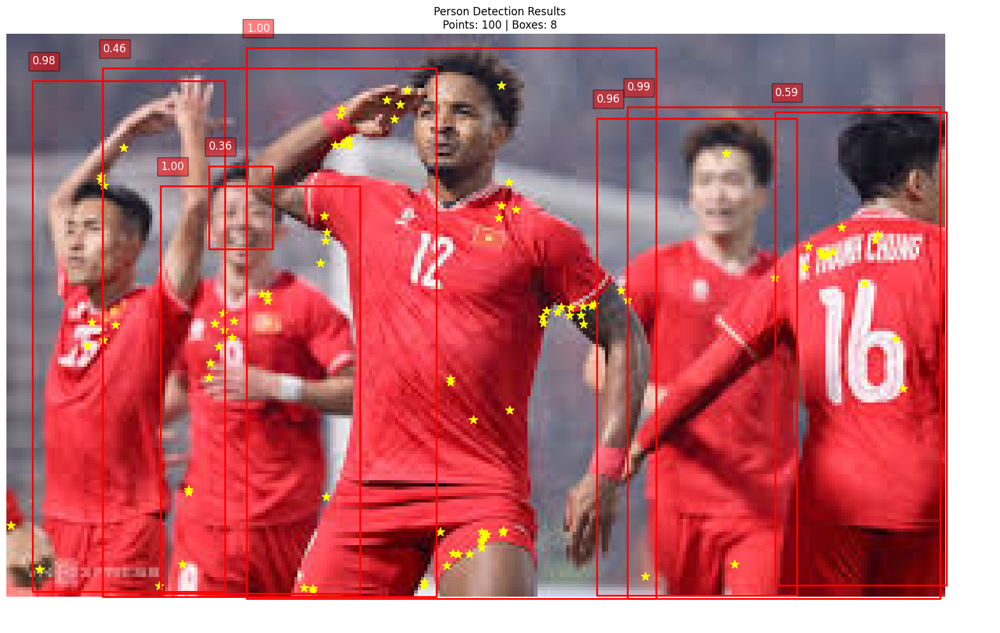

In [41]:
config = Config()

sam_predictor = setup_sam(config)

dataset_path = "/kaggle/input"  
image_dir = os.path.join(dataset_path, "test-1")   
sample_image_path = os.path.join(image_dir, os.listdir(image_dir)[0])  

print(f"Processing image: {sample_image_path}")

original_image, points, masks, boxes, scores = integrated_pseco_pipeline(sample_image_path, config, sam_predictor)

visualize_full_results(original_image, points, masks, boxes, scores)
